# ArtEmis Image Caption Generation - Exploratory Data Analysis

This notebook performs comprehensive exploratory data analysis on the ArtEmis dataset.

**Dataset:** ArtEmis (Affective Language for Visual Art)  
**Paper:** Achlioptas et al., CVPR 2021  
**Total Annotations:** 454,684  
**Unique Artworks:** 80,031

## 1. Setup and Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from pathlib import Path
import re
from PIL import Image
import warnings

# NLTK for text processing
import nltk
from nltk.tokenize import word_tokenize
from nltk.util import ngrams

warnings.filterwarnings('ignore')

# Set style
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 10

print("✓ All imports successful")

✓ All imports successful


## 2. Load Dataset

In [2]:
# Define paths
DATA_DIR = Path('../data/raw/artemis')
ARTEMIS_CSV = DATA_DIR / 'artemis_dataset_release_v0.csv'
WIKIART_DIR = Path('../data/raw/wikiart')

# Load ArtEmis dataset
df = pd.read_csv(ARTEMIS_CSV)

print(f"Dataset loaded successfully!")
print(f"Total annotations: {len(df):,}")
print(f"\nDataset shape: {df.shape}")
print(f"\nColumn names: {list(df.columns)}")

Dataset loaded successfully!
Total annotations: 454,684

Dataset shape: (454684, 5)

Column names: ['art_style', 'painting', 'emotion', 'utterance', 'repetition']


In [3]:
# Display first few rows
df.head(10)

,art_style,painting,emotion,utterance,repetition
0,Post_Impressionism,vincent-van-gogh_portrait-of-madame-ginoux-l-a...,something else,"She seems very happy in the picture, and you w...",10
1,Post_Impressionism,vincent-van-gogh_portrait-of-madame-ginoux-l-a...,sadness,This woman has really knotty hands which makes...,10
2,Post_Impressionism,vincent-van-gogh_portrait-of-madame-ginoux-l-a...,something else,"When looking at this woman, I am filled with c...",10
3,Post_Impressionism,vincent-van-gogh_portrait-of-madame-ginoux-l-a...,contentment,"A woman looking at ease, peaceful, and satisfi...",10
4,Post_Impressionism,vincent-van-gogh_portrait-of-madame-ginoux-l-a...,awe,She looks like a lady from that past that migh...,10
5,Expressionism,wassily-kandinsky_study-for-autumn-1909,awe,The bright colors make a very unique scene for...,7
6,Expressionism,wassily-kandinsky_study-for-autumn-1909,something else,"The way the image is presented, with large chu...",7
7,Impressionism,konstantin-korovin_yaroslavna-s-lament-1909,awe,the stroke of blue paint used to outline the h...,7
8,Impressionism,konstantin-korovin_yaroslavna-s-lament-1909,sadness,Some of the wooden panels are falling from the...,7
9,Impressionism,paul-gauguin_mette-gauguin-in-an-evening-dress...,awe,The golden gloves and white dress stand out an...,7


In [4]:
# Dataset info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 454684 entries, 0 to 454683
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   art_style   454684 non-null  object
 1   painting    454684 non-null  object
 2   emotion     454684 non-null  object
 3   utterance   454684 non-null  object
 4   repetition  454684 non-null  int64 
dtypes: int64(1), object(4)
memory usage: 17.3+ MB


## 3. Dataset Statistics

In [5]:
# Basic statistics
print("=" * 60)
print("ARTEMIS DATASET STATISTICS")
print("=" * 60)
print(f"Total annotations: {len(df):,}")
print(f"Unique artworks: {df['painting'].nunique():,}")
print(f"Unique art styles: {df['art_style'].nunique()}")
print(f"Unique emotions: {df['emotion'].nunique()}")
print(f"\nAverage annotations per artwork: {len(df) / df['painting'].nunique():.2f}")
print(f"Average repetition: {df['repetition'].mean():.2f}")
print(f"Max repetition: {df['repetition'].max()}")
print(f"Min repetition: {df['repetition'].min()}")

ARTEMIS DATASET STATISTICS
Total annotations: 454,684
Unique artworks: 80,031
Unique art styles: 27
Unique emotions: 9

Average annotations per artwork: 5.68
Average repetition: 8.53
Max repetition: 58
Min repetition: 5


### 3.1 Emotion Distribution

In [6]:
# Emotion distribution
emotion_counts = df['emotion'].value_counts()
print("\nEmotion Distribution:")
print(emotion_counts)
print(f"\nPercentages:")
print((emotion_counts / len(df) * 100).round(2))


Emotion Distribution:
emotion
contentment       126134
awe                72927
something else     52962
sadness            49061
amusement          45336
fear               41577
excitement         37636
disgust            22411
anger               6640
Name: count, dtype: int64

Percentages:
emotion
contentment       27.74
awe               16.04
something else    11.65
sadness           10.79
amusement          9.97
fear               9.14
excitement         8.28
disgust            4.93
anger              1.46
Name: count, dtype: float64


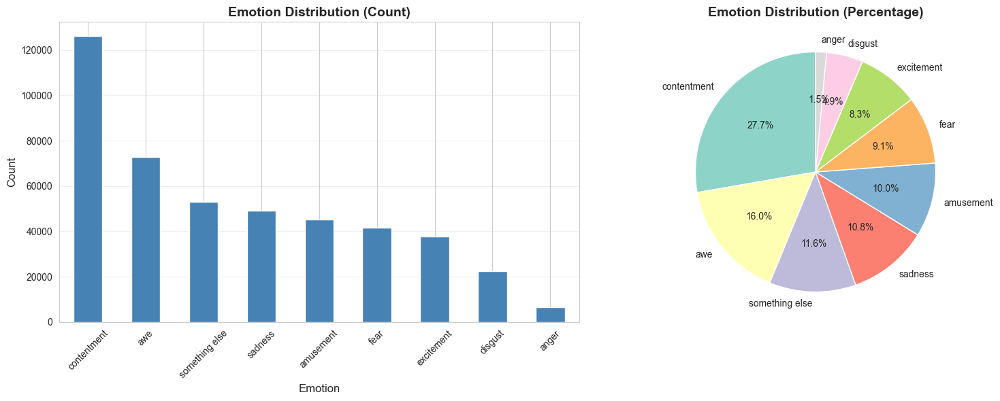

In [7]:
# Visualize emotion distribution
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Bar plot
emotion_counts.plot(kind='bar', ax=ax1, color='steelblue')
ax1.set_title('Emotion Distribution (Count)', fontsize=14, fontweight='bold')
ax1.set_xlabel('Emotion', fontsize=12)
ax1.set_ylabel('Count', fontsize=12)
ax1.tick_params(axis='x', rotation=45)
ax1.grid(axis='y', alpha=0.3)

# Pie chart
colors = plt.cm.Set3(range(len(emotion_counts)))
ax2.pie(emotion_counts, labels=emotion_counts.index, autopct='%1.1f%%', 
        colors=colors, startangle=90)
ax2.set_title('Emotion Distribution (Percentage)', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

### 3.2 Art Style Distribution

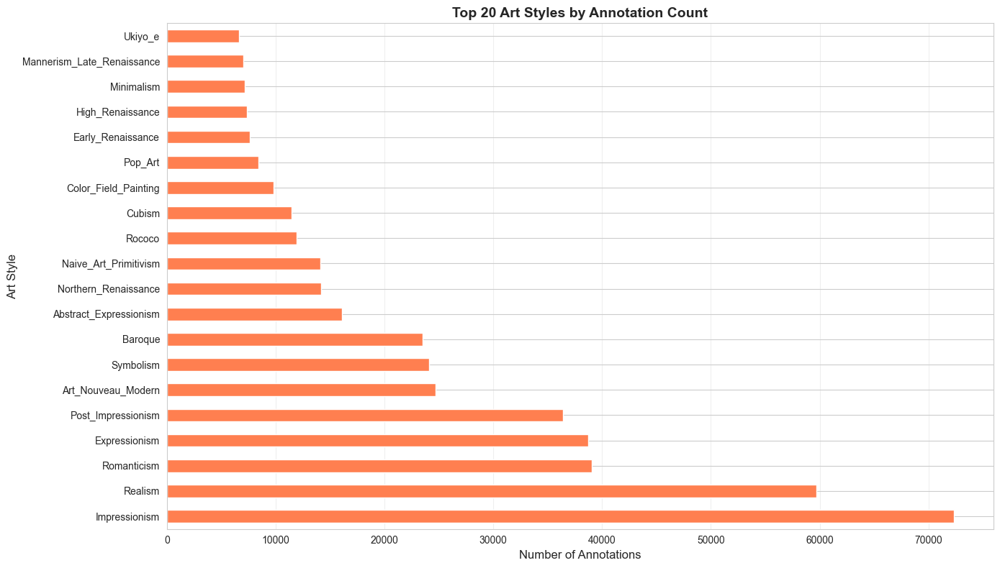


Top 10 Art Styles:
art_style
Impressionism             72361
Realism                   59681
Romanticism               39069
Expressionism             38717
Post_Impressionism        36374
Art_Nouveau_Modern        24711
Symbolism                 24103
Baroque                   23469
Abstract_Expressionism    16075
Northern_Renaissance      14160
Name: count, dtype: int64


In [8]:
# Art style distribution
style_counts = df['art_style'].value_counts().head(20)

plt.figure(figsize=(14, 8))
style_counts.plot(kind='barh', color='coral')
plt.title('Top 20 Art Styles by Annotation Count', fontsize=14, fontweight='bold')
plt.xlabel('Number of Annotations', fontsize=12)
plt.ylabel('Art Style', fontsize=12)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

print(f"\nTop 10 Art Styles:")
print(style_counts.head(10))

### 3.3 Caption Length Analysis

In [9]:
# Calculate caption lengths (in words)
df['caption_length'] = df['utterance'].apply(lambda x: len(str(x).split()))

# Statistics
print("Caption Length Statistics (in words):")
print(f"Mean: {df['caption_length'].mean():.2f}")
print(f"Median: {df['caption_length'].median():.2f}")
print(f"Std Dev: {df['caption_length'].std():.2f}")
print(f"Min: {df['caption_length'].min()}")
print(f"Max: {df['caption_length'].max()}")
print(f"\nPercentiles:")
print(df['caption_length'].quantile([0.25, 0.5, 0.75, 0.9, 0.95, 0.99]))

Caption Length Statistics (in words):
Mean: 15.69
Median: 14.00
Std Dev: 7.95
Min: 1
Max: 202

Percentiles:
0.25    11.0
0.50    14.0
0.75    18.0
0.90    25.0
0.95    30.0
0.99    45.0
Name: caption_length, dtype: float64


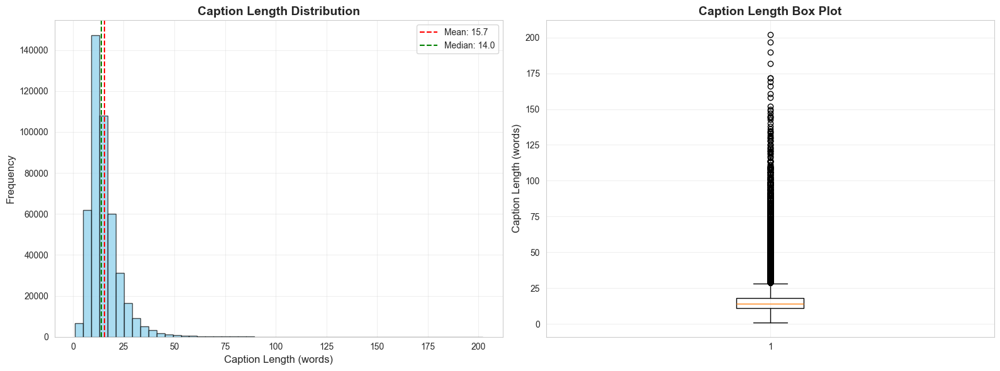

In [10]:
# Visualize caption length distribution
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Histogram
ax1.hist(df['caption_length'], bins=50, color='skyblue', edgecolor='black', alpha=0.7)
ax1.axvline(df['caption_length'].mean(), color='red', linestyle='--', 
            label=f'Mean: {df["caption_length"].mean():.1f}')
ax1.axvline(df['caption_length'].median(), color='green', linestyle='--', 
            label=f'Median: {df["caption_length"].median():.1f}')
ax1.set_title('Caption Length Distribution', fontsize=14, fontweight='bold')
ax1.set_xlabel('Caption Length (words)', fontsize=12)
ax1.set_ylabel('Frequency', fontsize=12)
ax1.legend()
ax1.grid(alpha=0.3)

# Box plot
ax2.boxplot(df['caption_length'], vert=True)
ax2.set_title('Caption Length Box Plot', fontsize=14, fontweight='bold')
ax2.set_ylabel('Caption Length (words)', fontsize=12)
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

### 3.4 Caption Length by Emotion

<Figure size 1400x600 with 0 Axes>

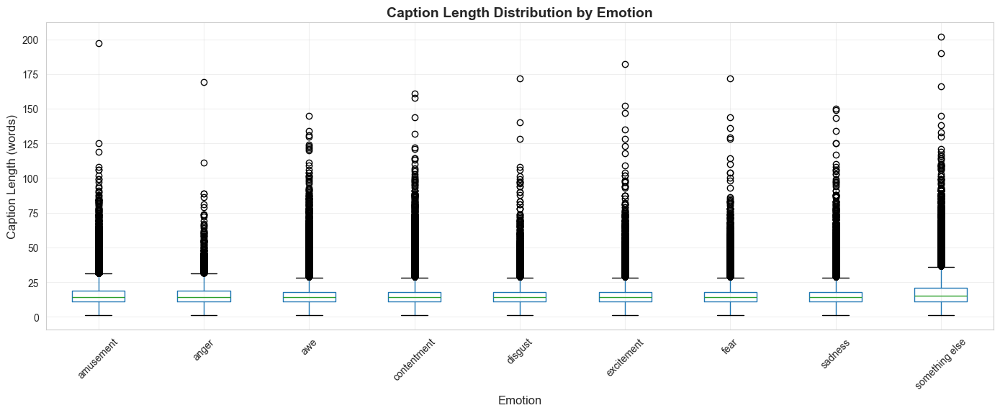


Average Caption Length by Emotion:
emotion
something else    17.213115
anger             16.173193
amusement         15.930607
sadness           15.744726
excitement        15.611330
awe               15.466206
fear              15.429083
disgust           15.391460
contentment       15.193072
Name: caption_length, dtype: float64


In [11]:
# Caption length by emotion
plt.figure(figsize=(14, 6))
df.boxplot(column='caption_length', by='emotion', figsize=(14, 6))
plt.title('Caption Length Distribution by Emotion', fontsize=14, fontweight='bold')
plt.suptitle('')  # Remove default title
plt.xlabel('Emotion', fontsize=12)
plt.ylabel('Caption Length (words)', fontsize=12)
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# Average caption length per emotion
print("\nAverage Caption Length by Emotion:")
print(df.groupby('emotion')['caption_length'].mean().sort_values(ascending=False))

## 4. Text Analysis

### 4.1 Vocabulary Analysis

In [12]:
# Tokenize all captions
def clean_and_tokenize(text):
    """Clean and tokenize text"""
    text = str(text).lower()
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    tokens = text.split()
    return tokens

# Get all tokens
all_tokens = []
for caption in df['utterance']:
    all_tokens.extend(clean_and_tokenize(caption))

print(f"Total tokens: {len(all_tokens):,}")
print(f"Unique tokens (vocabulary): {len(set(all_tokens)):,}")
print(f"Average tokens per caption: {len(all_tokens) / len(df):.2f}")

Total tokens: 7,124,681
Unique tokens (vocabulary): 57,991
Average tokens per caption: 15.67


In [13]:
# Word frequency
word_freq = Counter(all_tokens)
most_common = word_freq.most_common(30)

print("\nTop 30 Most Common Words:")
for word, count in most_common:
    print(f"{word:20s}: {count:6,} ({count/len(all_tokens)*100:.2f}%)")


Top 30 Most Common Words:
the                 : 660,156 (9.27%)
and                 : 257,454 (3.61%)
a                   : 238,508 (3.35%)
of                  : 210,631 (2.96%)
is                  : 180,436 (2.53%)
to                  : 134,277 (1.88%)
in                  : 126,483 (1.78%)
like                : 119,114 (1.67%)
this                : 118,255 (1.66%)
i                   : 97,111 (1.36%)
it                  : 93,980 (1.32%)
looks               : 91,427 (1.28%)
me                  : 76,573 (1.07%)
are                 : 70,959 (1.00%)
on                  : 63,827 (0.90%)
with                : 58,486 (0.82%)
painting            : 49,095 (0.69%)
colors              : 47,898 (0.67%)
look                : 47,630 (0.67%)
feel                : 45,939 (0.64%)
makes               : 45,699 (0.64%)
very                : 45,596 (0.64%)
that                : 41,203 (0.58%)
be                  : 37,420 (0.53%)
her                 : 37,366 (0.52%)
man                 : 33,792 (0.47%)
at

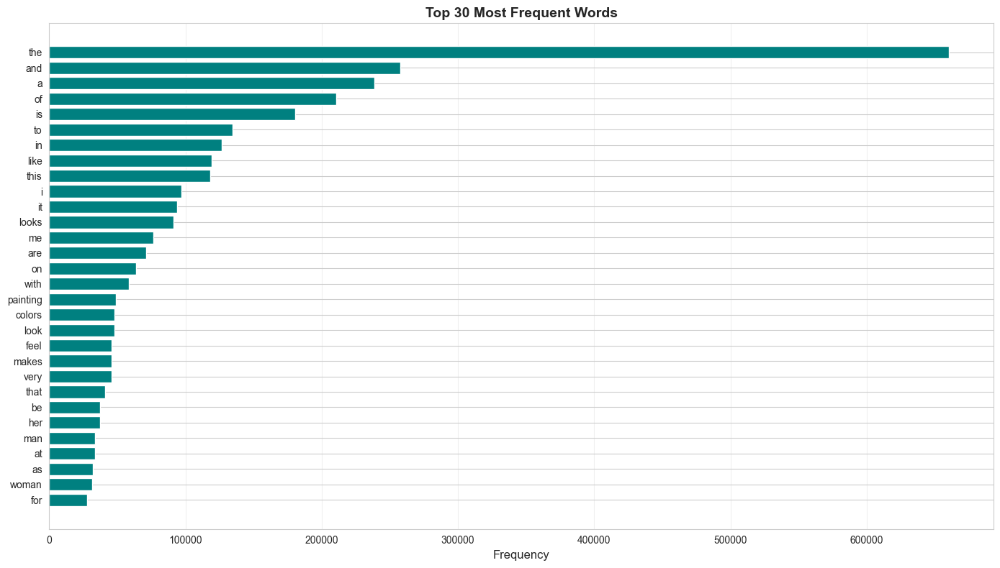

In [14]:
# Visualize top words
words, counts = zip(*most_common)

plt.figure(figsize=(14, 8))
plt.barh(range(len(words)), counts, color='teal')
plt.yticks(range(len(words)), words)
plt.xlabel('Frequency', fontsize=12)
plt.title('Top 30 Most Frequent Words', fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

### 4.2 Word Cloud

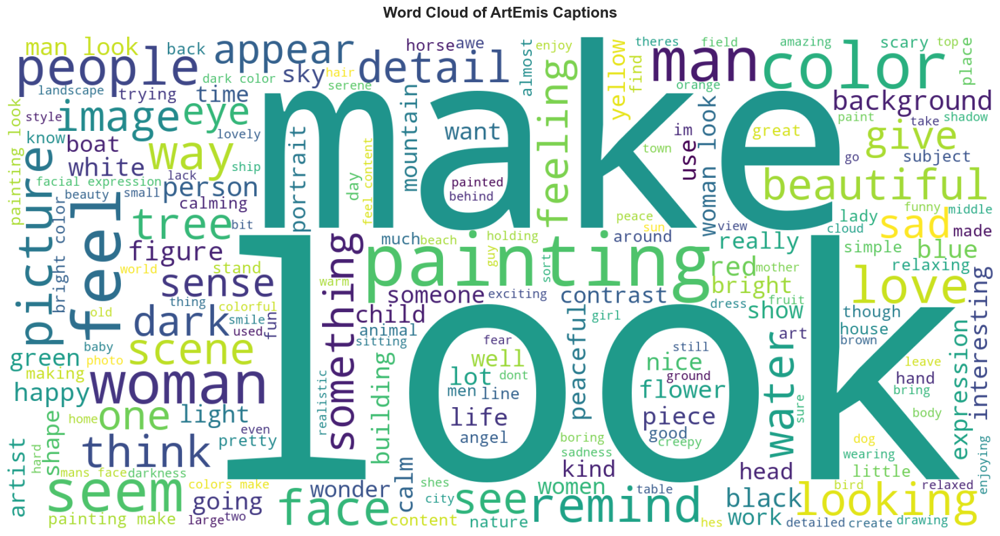

In [15]:
# Install wordcloud if needed
try:
    from wordcloud import WordCloud
except ImportError:
    print("Installing wordcloud...")
    !pip install wordcloud
    from wordcloud import WordCloud

# Generate word cloud
text = ' '.join(all_tokens)
wordcloud = WordCloud(width=1600, height=800, background_color='white', 
                      colormap='viridis', max_words=200).generate(text)

plt.figure(figsize=(16, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of ArtEmis Captions', fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

### 4.3 Bigram Analysis

In [16]:
# Generate bigrams
bigram_list = []
for caption in df['utterance']:
    tokens = clean_and_tokenize(caption)
    if len(tokens) >= 2:
        bigram_list.extend(list(ngrams(tokens, 2)))

bigram_freq = Counter(bigram_list)
top_bigrams = bigram_freq.most_common(20)

print("Top 20 Bigrams:")
for bigram, count in top_bigrams:
    print(f"{' '.join(bigram):30s}: {count:6,}")

Top 20 Bigrams:
of the                        : 61,193
in the                        : 52,036
looks like                    : 49,748
and the                       : 40,570
makes me                      : 29,803
like a                        : 29,736
on the                        : 29,197
to be                         : 26,052
of a                          : 21,919
me feel                       : 20,247
like the                      : 19,020
this painting                 : 18,975
the colors                    : 18,688
is a                          : 18,687
the man                       : 18,383
the painting                  : 17,859
the woman                     : 17,844
it looks                      : 17,386
with the                      : 16,739
me of                         : 15,404


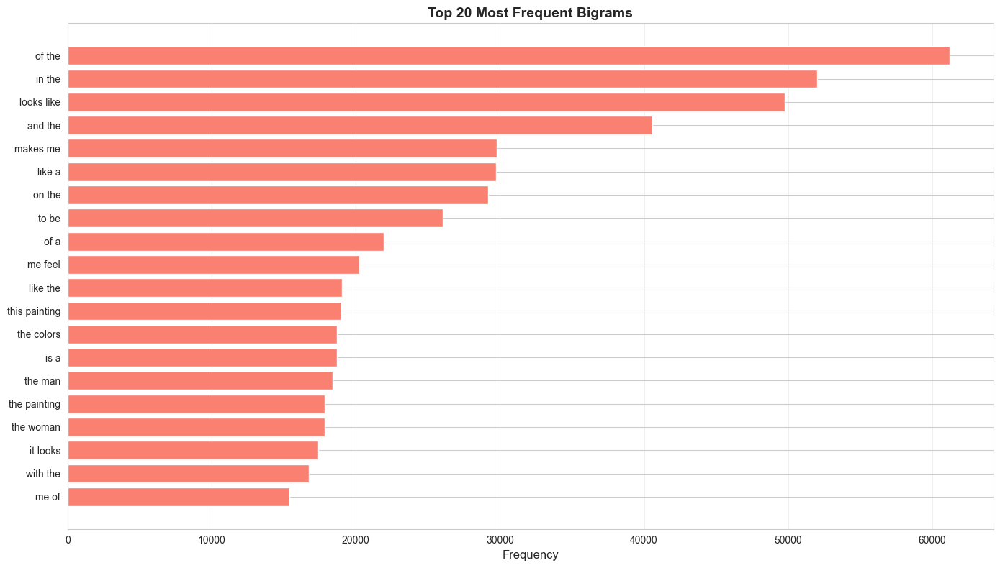

In [17]:
# Visualize top bigrams
bigrams_str = [' '.join(bg) for bg, _ in top_bigrams]
bigram_counts = [count for _, count in top_bigrams]

plt.figure(figsize=(14, 8))
plt.barh(range(len(bigrams_str)), bigram_counts, color='salmon')
plt.yticks(range(len(bigrams_str)), bigrams_str)
plt.xlabel('Frequency', fontsize=12)
plt.title('Top 20 Most Frequent Bigrams', fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

### 4.4 Emotional Keywords

In [18]:
# Define emotional keyword categories
emotional_keywords = {
    'positive': ['happy', 'joy', 'beautiful', 'love', 'peaceful', 'calm', 'wonderful', 'amazing'],
    'negative': ['sad', 'dark', 'angry', 'fear', 'scary', 'disturbing', 'depressing', 'gloomy'],
    'awe': ['awe', 'amazing', 'stunning', 'magnificent', 'grand', 'impressive'],
    'colors': ['red', 'blue', 'green', 'yellow', 'black', 'white', 'color', 'bright', 'dark']
}

# Count emotional keywords
for category, keywords in emotional_keywords.items():
    count = sum(word_freq.get(word, 0) for word in keywords)
    print(f"{category.capitalize():15s}: {count:6,} occurrences")

Positive       : 70,259 occurrences
Negative       : 51,721 occurrences
Awe            : 11,228 occurrences
Colors         : 126,456 occurrences


## 5. Visual Analysis - Sample Images

Random Sample Images with Captions:


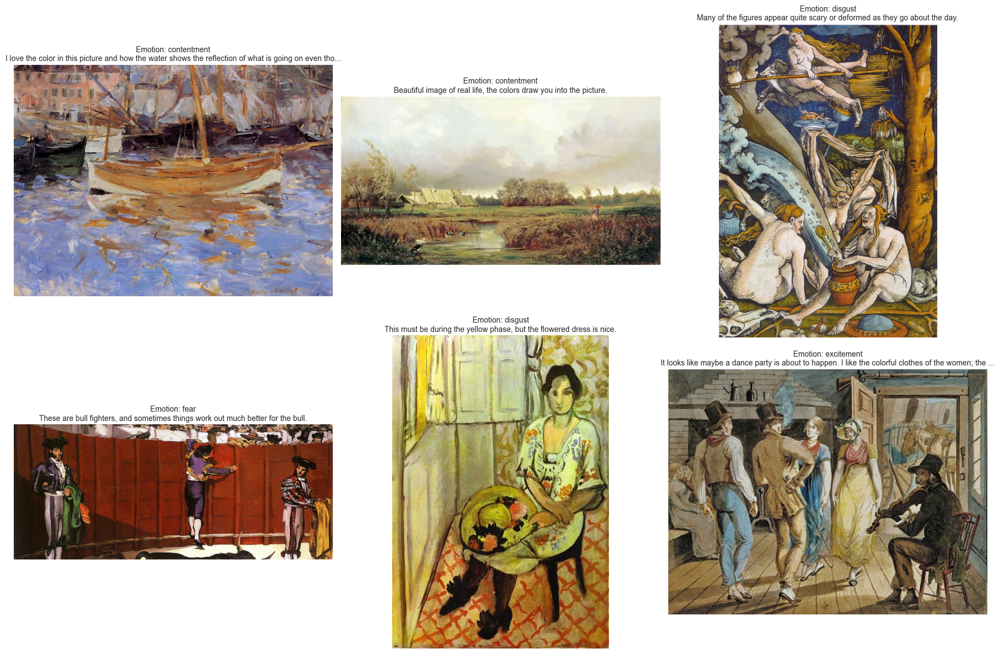

In [19]:
# Function to display images with captions
def display_samples(df, n_samples=6, emotion=None):
    """Display sample images with their captions"""
    if emotion:
        sample_df = df[df['emotion'] == emotion].sample(n=min(n_samples, len(df)))
    else:
        sample_df = df.sample(n=n_samples)
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    for idx, (_, row) in enumerate(sample_df.iterrows()):
        if idx >= len(axes):
            break
        
        # Construct image path
        img_path = WIKIART_DIR / row['art_style'] / f"{row['painting']}.jpg"
        
        try:
            img = Image.open(img_path)
            axes[idx].imshow(img)
            axes[idx].axis('off')
            
            # Add caption
            caption = row['utterance'][:100] + '...' if len(row['utterance']) > 100 else row['utterance']
            title = f"Emotion: {row['emotion']}\n{caption}"
            axes[idx].set_title(title, fontsize=10, wrap=True)
        except FileNotFoundError:
            axes[idx].text(0.5, 0.5, 'Image not found', ha='center', va='center')
            axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

# Display random samples
print("Random Sample Images with Captions:")
display_samples(df, n_samples=6)


Samples for emotion: SOMETHING ELSE


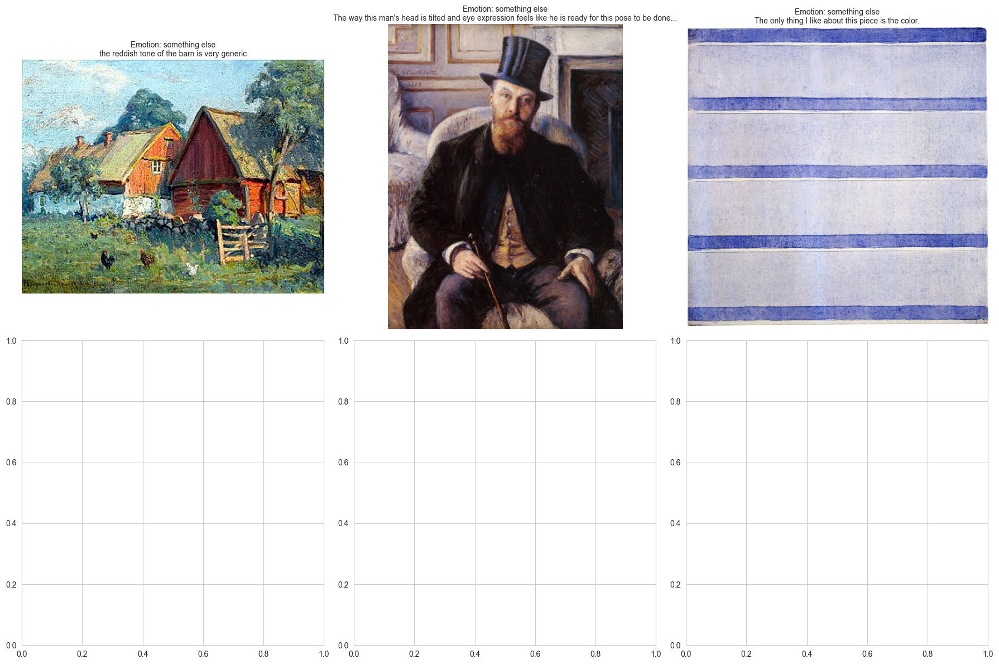


Samples for emotion: SADNESS


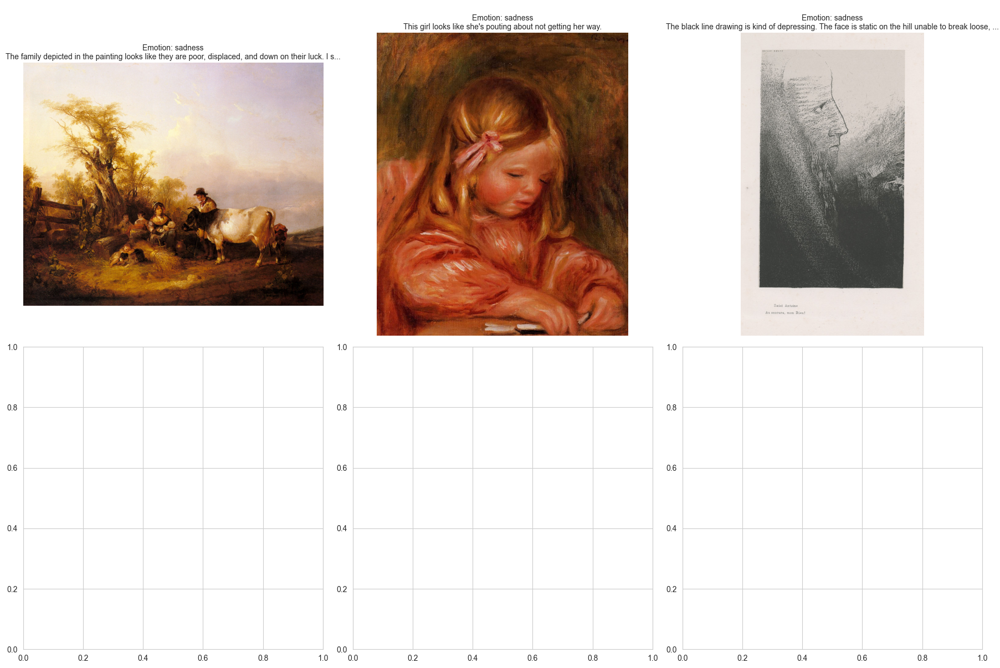


Samples for emotion: CONTENTMENT


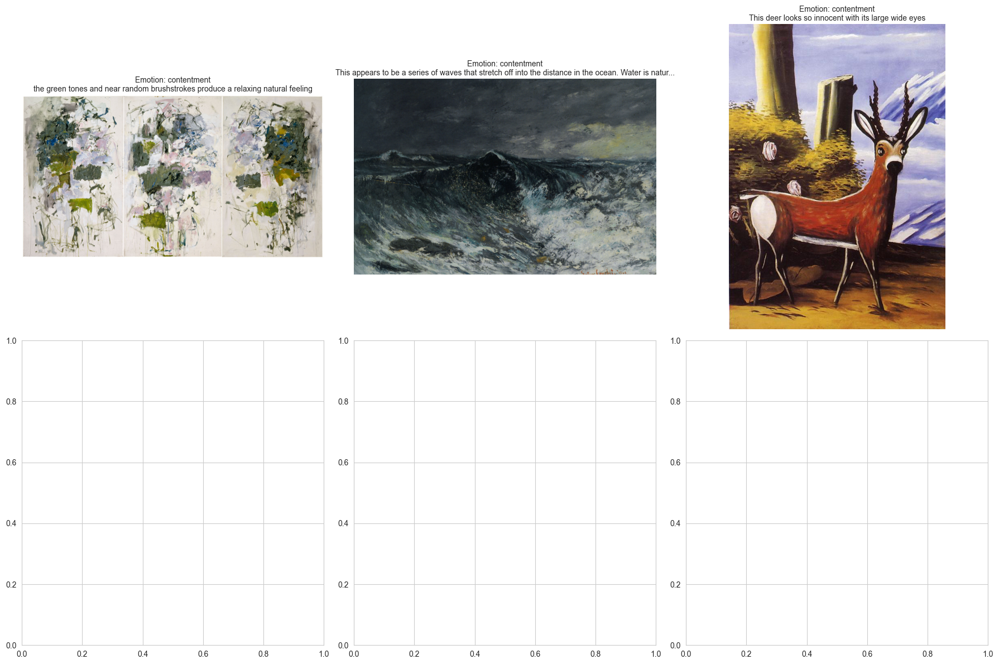

In [20]:
# Display samples for each emotion
emotions = df['emotion'].unique()[:3]  # Show first 3 emotions

for emotion in emotions:
    print(f"\nSamples for emotion: {emotion.upper()}")
    display_samples(df, n_samples=3, emotion=emotion)

## 6. Caption Diversity Analysis

In [21]:
# Unique captions
unique_captions = df['utterance'].nunique()
total_captions = len(df)

print(f"Total captions: {total_captions:,}")
print(f"Unique captions: {unique_captions:,}")
print(f"Diversity ratio: {unique_captions/total_captions:.2%}")

# Most repeated captions
print("\nMost Repeated Captions:")
caption_counts = df['utterance'].value_counts().head(10)
for caption, count in caption_counts.items():
    print(f"Count: {count:3d} - {caption[:80]}...")

Total captions: 454,684
Unique captions: 453,855
Diversity ratio: 99.82%

Most Repeated Captions:
Count:  21 - The actions of the people as well as the coloring....
Count:  21 - it is well shades,the combination of color is perfect ,the details is well shown...
Count:  20 - the religious reverence of the figures...
Count:  20 - Nice shading and contour....
Count:  15 - the serene village makes me feel calm to me...
Count:  14 - Pictures of nature relax me....
Count:  14 - I don't have an emotional reaction to this image....
Count:   9 - the grandeur of the architecture...
Count:   9 - I don't like nakedness, even in art....
Count:   9 - Pictures of nature make me feel relaxed....


## 7. Vocabulary Size for Different Thresholds

Vocabulary size (min freq >=   1): 57,991
Vocabulary size (min freq >=   2): 29,380
Vocabulary size (min freq >=   5): 17,565
Vocabulary size (min freq >=  10): 12,423
Vocabulary size (min freq >=  20):  8,675
Vocabulary size (min freq >=  50):  5,365
Vocabulary size (min freq >= 100):  3,491


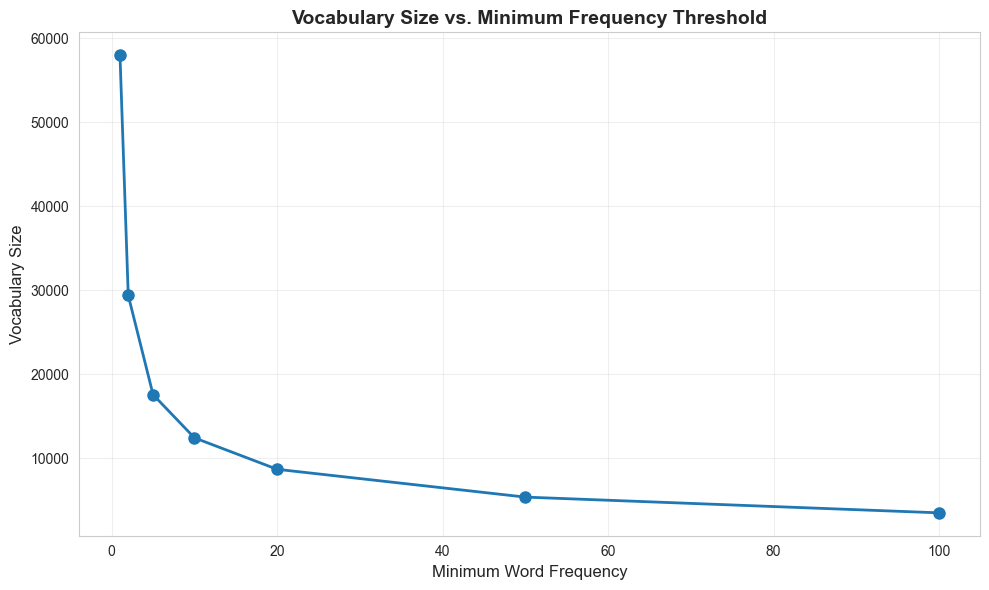

In [22]:
# Vocabulary size at different frequency thresholds
thresholds = [1, 2, 5, 10, 20, 50, 100]
vocab_sizes = []

for threshold in thresholds:
    vocab_size = sum(1 for word, count in word_freq.items() if count >= threshold)
    vocab_sizes.append(vocab_size)
    print(f"Vocabulary size (min freq >= {threshold:3d}): {vocab_size:6,}")

# Visualize
plt.figure(figsize=(10, 6))
plt.plot(thresholds, vocab_sizes, marker='o', linewidth=2, markersize=8)
plt.xlabel('Minimum Word Frequency', fontsize=12)
plt.ylabel('Vocabulary Size', fontsize=12)
plt.title('Vocabulary Size vs. Minimum Frequency Threshold', fontsize=14, fontweight='bold')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

## 8. Key Findings Summary

In [23]:
print("="*70)
print("KEY FINDINGS FROM EXPLORATORY DATA ANALYSIS")
print("="*70)
print(f"\n1. DATASET OVERVIEW")
print(f"   - Total annotations: {len(df):,}")
print(f"   - Unique artworks: {df['painting'].nunique():,}")
print(f"   - Art styles: {df['art_style'].nunique()}")
print(f"   - Emotions: {df['emotion'].nunique()}")

print(f"\n2. CAPTION STATISTICS")
print(f"   - Average caption length: {df['caption_length'].mean():.1f} words")
print(f"   - Median caption length: {df['caption_length'].median():.1f} words")
print(f"   - 95th percentile: {df['caption_length'].quantile(0.95):.0f} words")

print(f"\n3. VOCABULARY")
print(f"   - Total tokens: {len(all_tokens):,}")
print(f"   - Unique words: {len(set(all_tokens)):,}")
print(f"   - Vocabulary (freq >= 2): {sum(1 for w, c in word_freq.items() if c >= 2):,}")
print(f"   - Vocabulary (freq >= 5): {sum(1 for w, c in word_freq.items() if c >= 5):,}")

print(f"\n4. EMOTION DISTRIBUTION")
top_3_emotions = df['emotion'].value_counts().head(3)
for emotion, count in top_3_emotions.items():
    print(f"   - {emotion}: {count:,} ({count/len(df)*100:.1f}%)")

print(f"\n5. CAPTION DIVERSITY")
print(f"   - Unique captions: {unique_captions:,} ({unique_captions/total_captions:.1%})")

print(f"\n6. RECOMMENDATIONS FOR PREPROCESSING")
print(f"   - Suggested max caption length: 30 words (covers ~95% of data)")
print(f"   - Suggested vocabulary size: 10,000 words")
print(f"   - Minimum word frequency: 2 (reduces vocabulary significantly)")
print("="*70)

KEY FINDINGS FROM EXPLORATORY DATA ANALYSIS

1. DATASET OVERVIEW
   - Total annotations: 454,684
   - Unique artworks: 80,031
   - Art styles: 27
   - Emotions: 9

2. CAPTION STATISTICS
   - Average caption length: 15.7 words
   - Median caption length: 14.0 words
   - 95th percentile: 30 words

3. VOCABULARY
   - Total tokens: 7,124,681
   - Unique words: 57,991
   - Vocabulary (freq >= 2): 29,380
   - Vocabulary (freq >= 5): 17,565

4. EMOTION DISTRIBUTION
   - contentment: 126,134 (27.7%)
   - awe: 72,927 (16.0%)
   - something else: 52,962 (11.6%)

5. CAPTION DIVERSITY
   - Unique captions: 453,855 (99.8%)

6. RECOMMENDATIONS FOR PREPROCESSING
   - Suggested max caption length: 30 words (covers ~95% of data)
   - Suggested vocabulary size: 10,000 words
   - Minimum word frequency: 2 (reduces vocabulary significantly)


## 9. Export Statistics for Documentation

In [24]:
# Save statistics to file
stats = {
    'total_annotations': len(df),
    'unique_artworks': df['painting'].nunique(),
    'art_styles': df['art_style'].nunique(),
    'emotions': df['emotion'].nunique(),
    'avg_caption_length': df['caption_length'].mean(),
    'median_caption_length': df['caption_length'].median(),
    'total_tokens': len(all_tokens),
    'vocabulary_size': len(set(all_tokens)),
    'unique_captions': unique_captions,
    'diversity_ratio': unique_captions/total_captions
}

# Save to JSON
import json
output_dir = Path('../outputs')
output_dir.mkdir(exist_ok=True)

with open(output_dir / 'eda_statistics.json', 'w') as f:
    json.dump(stats, f, indent=2)

print("✓ Statistics saved to ../outputs/eda_statistics.json")

✓ Statistics saved to ../outputs/eda_statistics.json


---
## Conclusion

This exploratory data analysis provides comprehensive insights into the ArtEmis dataset:

1. **Dataset is well-balanced** across emotions with slight preference for positive emotions
2. **Caption lengths are reasonable** (avg ~15 words), suitable for LSTM/Transformer models
3. **Rich vocabulary** with ~50k unique words, but can be reduced to 10k for efficiency
4. **High caption diversity** indicating varied emotional expressions
5. **Common themes** include colors, emotions, and artistic elements

**Next Steps:**
- Implement preprocessing pipeline
- Create train/val/test splits
- Build vocabulary with 10,000 most frequent words
- Set max caption length to 30 words

---